# Full Analysis for Embedding single cell data with scGPT 
- scGPT is a tool for embedding single cell data with scGPT 

- Block 1: Data Loading and setting up the environment
- Block 2: Data Preprocessing
- Block 3: Embedding the data
- Block 4: Visualizing the data
- Block 5: Saving the data




## Block 1: Data Loading and setting up the environment 

In [1]:
from pathlib import Path
import os
import sys

from pathlib import Path
import os
import sys

def setup_directories():
    """Set up necessary directories and paths"""
    current_dir = Path.cwd()
    # Navigate to the correct scGPT directory
    scgpt_dir = Path("/root/scGPT_dir/scGPT")  # The actual scGPT package directory
    
    # Add both the main directory and the package directory
    if str(scgpt_dir) not in sys.path:
        sys.path.append(str(scgpt_dir))
    
    scgpt_package_dir = scgpt_dir / "scgpt"
    if str(scgpt_package_dir) not in sys.path:
        sys.path.append(str(scgpt_package_dir))
    
    data_dir = scgpt_dir / "data"
    save_dir = scgpt_dir / "save"
    
    data_dir.mkdir(parents=True, exist_ok=True)
    save_dir.mkdir(parents=True, exist_ok=True)
    
    return scgpt_dir, data_dir, save_dir

# Set up directories
scgpt_dir, data_dir, save_dir = setup_directories()

print(f"scGPT directory: {scgpt_dir}")
print(f"Data directory: {data_dir}")
print(f"Save directory: {save_dir}")
print (f"Current working directory: {os.getcwd()}")
print (sys.executable)


# Set up model directory
model_dir = data_dir / "scGPT_Human"
print("\nFiles in model directory:")
if model_dir.exists():
    print(f"Model directory exists: {model_dir}")
    for file in model_dir.iterdir():
        print(f"- {file.name} (Size: {file.stat().st_size / (1024 * 1024):.2f} MB)")
else:
    print("Model directory does not exist")

scGPT directory: /root/scGPT_dir/scGPT
Data directory: /root/scGPT_dir/scGPT/data
Save directory: /root/scGPT_dir/scGPT/save
Current working directory: /root/scGPT_dir/scGPT/scGPT_tools/notebooks
/opt/mamba/envs/default/bin/python

Files in model directory:
Model directory exists: /root/scGPT_dir/scGPT/data/scGPT_Human
- best_model.pt (Size: 195.87 MB)
- vocab.json (Size: 1.26 MB)
- args.json (Size: 0.00 MB)


In [2]:
#Finetuning to improve the model and the performance of the model 

#first, we load in all the data and ensure that the preprocessing is correct 

# Packages 
# %%
import copy
import gc
import json
import os
from pathlib import Path
import shutil
import sys
import time
import traceback
from typing import List, Tuple, Dict, Union, Optional
import warnings
import pandas as pd
# from . import asyn
import pickle
import torch
from anndata import AnnData
import scanpy as sc
#import scvi
import seaborn as sns
import numpy as np
#import wandb
from scipy.sparse import issparse
import matplotlib.pyplot as plt
from torch import nn
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from torchtext.vocab import Vocab
from torchtext._torchtext import (
    Vocab as VocabPybind,
)
from sklearn.metrics import confusion_matrix

import scgpt as scg
from scgpt.model import TransformerModel, AdversarialDiscriminator
from scgpt.tokenizer import tokenize_and_pad_batch, random_mask_value
from scgpt.loss import (
    masked_mse_loss,
    masked_relative_error,
    criterion_neg_log_bernoulli,
)
from scgpt.tokenizer.gene_tokenizer import GeneVocab
from scgpt.preprocess import Preprocessor
from scgpt import SubsetsBatchSampler
from scgpt.utils import set_seed, category_str2int, eval_scib_metrics

sc.set_figure_params(figsize=(6, 6))
os.environ["KMP_WARNINGS"] = "off"
warnings.filterwarnings('ignore')

/opt/mamba/envs/default/lib/python3.9/site-packages/torchtext/vocab/__init__.py:4: UserWarning: 
/!\ IMPORTANT WARNING ABOUT TORCHTEXT STATUS /!\ 
Torchtext is deprecated and the last released version will be 0.18 (this one). You can silence this warning by calling the following at the beginnign of your scripts: `import torchtext; torchtext.disable_torchtext_deprecation_warning()`
  warnings.warn(torchtext._TORCHTEXT_DEPRECATION_MSG)
/opt/mamba/envs/default/lib/python3.9/site-packages/torchtext/utils.py:4: UserWarning: 
/!\ IMPORTANT WARNING ABOUT TORCHTEXT STATUS /!\ 
Torchtext is deprecated and the last released version will be 0.18 (this one). You can silence this warning by calling the following at the beginnign of your scripts: `import torchtext; torchtext.disable_torchtext_deprecation_warning()`
  warnings.warn(torchtext._TORCHTEXT_DEPRECATION_MSG)
/opt/mamba/envs/default/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipyw

### Import Data


In [3]:
import requests
from tqdm import tqdm
import pandas as pd
from pathlib import Path

# Current dataset info: 
# At some point we can make this nicer, either with hyperparameters or with a config file, but it works for now 
#dataset_name = 'Stromal_cells_all_non-immune_cells_embedded'
#dataset_download_url = "https://datasets.cellxgene.cziscience.com/617749e2-71cb-428f-9eb7-bad1cf7988ef.h5ad"
#dataset_id = "617749e2-71cb-428f-9eb7-bad1cf7988ef"
#file_path = data_dir / "Stromal_cells_all_non-immune_cells.h5ad"

dataset_name = 'Human_breast_cell_HBCA_global_atlas'
dataset_download_url = "https://datasets.cellxgene.cziscience.com/2b284c0b-8a93-4138-a466-9c2bbe9db733.h5ad"
dataset_id = "2b284c0b-8a93-4138-a466-9c2bbe9db733"
file_path = data_dir / "Human_breast_cell_HBCA_global_atlas.h5ad"

# Create tracking file if it doesn't exist
tracking_file = data_dir / 'dataset_tracking.csv'
if not tracking_file.exists():
    print(f"Creating tracking file {tracking_file}")
    pd.DataFrame(columns=['name', 'path', 'last_used', 'times_used', 'dataset_id', 'dataset_url']).to_csv(tracking_file, index=False)

# Download with progress bar if file doesn't exist
if not file_path.exists():
    print(f"Downloading {dataset_name} from {dataset_download_url} to {file_path}")
    response = requests.get(dataset_download_url, stream=True)
    total_size = int(response.headers.get('content-length', 0))
    
    with open(file_path, 'wb') as file, tqdm(total=total_size, unit='B', unit_scale=True) as pbar:
        for chunk in response.iter_content(chunk_size=8192):
            file.write(chunk)
            pbar.update(len(chunk))
else:
    print(f"Data already exists at {file_path}")

df = pd.read_csv(tracking_file)

if str(file_path) in df['path'].values:
    # Update existing entry
    # Check if this file was already accessed in the last hour to avoid duplicate counts
    print(f"Tracking file location: {tracking_file}")
    last_access = pd.to_datetime(df.loc[df['path'] == str(file_path), 'last_used'].iloc[0])
    if pd.Timestamp.now() - last_access < pd.Timedelta(hours=6):
        print("File accessed within the last hour - skipping increment")
    else:
        mask = df['path'] == str(file_path)
        df.loc[mask, 'times_used'] = df.loc[mask, 'times_used'].fillna(0) + 1
        df.loc[mask, 'last_used'] = pd.Timestamp.now()
else:
    # Add new entry (either for newly downloaded or existing untracked file)
    print (f"Adding new entry for {dataset_name} to tracking file")
    new_row = {'name': dataset_name, 'path': str(file_path), 
               'last_used': pd.Timestamp.now(), 'times_used': 1, 
               'dataset_id': dataset_id, 'dataset_url': dataset_download_url}
    df = pd.concat([df, pd.DataFrame([new_row])], ignore_index=True)

df.to_csv(tracking_file, index=False)
print("Tracking updated!")

#it didn't update tracked, need to fix this #maybe better to do since last restart of computer, or idk, something like that 

Data already exists at /root/scGPT_dir/scGPT/data/Human_breast_cell_HBCA_global_atlas.h5ad
Tracking file location: /root/scGPT_dir/scGPT/data/dataset_tracking.csv
File accessed within the last hour - skipping increment
Tracking updated!


In [4]:

# Display the tracking CSV file contents
print("Current dataset tracking:")
tracking_df = pd.read_csv(tracking_file)
display(tracking_df[['name', 'path', 'last_used', 'times_used', 'dataset_id']])


Current dataset tracking:


,name,path,last_used,times_used,dataset_id
0,Stromal_cells_all_non-immune_cells_embedded,/root/scGPT_dir/scGPT/data/Stromal_cells_all_n...,2025-02-19 08:58:19.282352,4,617749e2-71cb-428f-9eb7-bad1cf7988ef
1,Human_breast_cell_HBCA_global_atlas,/root/scGPT_dir/scGPT/data/Human_breast_cell_H...,2025-02-19 12:45:16.716577,1,2b284c0b-8a93-4138-a466-9c2bbe9db733


## Block 2: Data Preprocessing

In [25]:
import scipy.sparse as sparse
import my_src.my_utils
my_src.my_utils.sparse = sparse


# Load with specific obs metadata columns
adata = load_subset_anndata(
    file_path,
    start_row=0,
    n_rows=50000,
    obs_columns=["cell_type", "broad_cell_class", "donor_id"],
)

print("AnnData shape:", adata_filtered.shape)
print("Feature metadata columns:", adata_filtered.var.columns)  # Print all var metadata
print(
    "Selected Observation metadata columns:", adata_filtered.obs.columns
)  # Print selected obs metadata
print(
    "Matrix density:",
    adata_filtered.X.nnz / (adata_filtered.shape[0] * adata_filtered.shape[1]),
)

AnnData shape: (100000, 34455)
Feature metadata columns: Index(['_index', 'dispersions', 'dispersions_norm', 'feature_biotype',
       'feature_is_filtered', 'feature_length', 'feature_name',
       'feature_reference', 'feature_type', 'feature_types', 'gene_name',
       'genome', 'highly_variable', 'means', 'n_cells'],
      dtype='object')
Selected Observation metadata columns: Index(['cell_type', 'donor_id'], dtype='object')
Matrix density: 0.05959303003918154


In [27]:
#todo's: Make sure that not all the keys are being printed if not needed 

if 'adata' not in locals():
    adata = sc.read(file_path)

#check annotation keys 
from my_src.my_utils import check_annotation_keys
adata_keys = check_annotation_keys(adata)

#check the number of cells and features 
print (adata.shape)
print (adata_keys)

celltype = adata_keys['cell_type_keys'][0]
print (celltype)

gene_col = adata_keys['gene_keys'][0]

#check the number of cells and features 
print (adata.shape)

# Check if scGPT embedding already exists
if 'X_scGPT' in adata.layers:
    print("scGPT embedding already exists in the data!")
    embed = True
else:
    embed = False

print("\n" + "="*50)
print(f"Cell type column: {celltype}")
print(f"Gene name column: {gene_col}")
print(f"Embedding exists: {embed}")
print("="*50 + "\n")



Checking cell type annotations in .obs:

✓ Found 'cell_type' with 11 unique values
Examples:
  1. endothelial cell of lymphatic vessel
  2. luminal adaptive secretory precursor cell of mammary gland
  3. fibroblast of mammary gland
  4. luminal hormone-sensing cell of mammary gland
  5. blood vessel endothelial cell
Top counts:
  luminal adaptive secretory precursor cell of mammary gland: 11618 cells
  fibroblast of mammary gland: 11395 cells
  blood vessel endothelial cell: 8038 cells
  luminal hormone-sensing cell of mammary gland: 7736 cells
  perivascular cell: 5663 cells

Checking gene annotations in .var:

✓ Found 'gene_name' with 34455 unique values
Examples:
  1. MIR1302-2HG
  2. OR4F5
  3. AL627309.1
  4. AL627309.3
  5. AL627309.5

✓ Found 'feature_name' with 34455 unique values
Examples:
  1. MIR1302-2HG
  2. OR4F5
  3. ENSG00000238009.6
  4. ENSG00000239945.1
  5. ENSG00000241860.7

Checking highly variable gene annotations in .var:

✓ Found 'highly_variable' (boolean) wit

In [28]:
print(adata)
# Check donor information
donor_col = 'donor_id'

n_donors = adata.obs[donor_col].nunique()
print(f"\nNumber of unique donors: {n_donors}")

# Create a cross-tabulation of donor_id and cell_type
donor_cell_matrix = pd.crosstab(adata.obs[donor_col], adata.obs[celltype])

# Create heatmap using plotly
import plotly.express as px
import numpy as np

# Apply log10 transform to the data (adding 1 to avoid log(0))
log_data = np.log10(donor_cell_matrix.values + 1)

# Create regular heatmap with log-transformed data
fig = px.imshow(
    log_data,
    labels=dict(x="Cell Type", y="Donor ID", color="Count"),
    x=donor_cell_matrix.columns,
    y=donor_cell_matrix.index,
    color_continuous_scale='Viridis',
    title='Cell Type Distribution Across Donors (Log Scale)',
    aspect='auto'
)

# Update hover template to show both log and linear values
fig.data[0].customdata = donor_cell_matrix.values
fig.data[0].hovertemplate = "Cell Type: %{x}<br>Donor ID: %{y}<br>Count: %{customdata:.0f}<br>Log10 Count: %{z:.2f}<extra></extra>"

# Create tick values for the colorbar (in log space)
tick_values = np.linspace(log_data.min(), log_data.max(), 6)
# Convert tick values back to linear space for labels
tick_labels = [f"{int(10**x - 1)}" for x in tick_values]

# Update layout and colorbar
fig.update_layout(
    xaxis_title='Cell Type',
    yaxis_title='Donor ID',
    coloraxis=dict(
        colorbar=dict(
            title='Count',
            tickvals=tick_values,
            ticktext=tick_labels
        )
    )
)

# Use display() instead of show() to avoid nbformat dependency
from IPython.display import display
display(fig)


AnnData object with n_obs × n_vars = 50000 × 34455
    obs: 'cell_type', 'donor_id'
    var: '_index', 'dispersions', 'dispersions_norm', 'feature_biotype', 'feature_is_filtered', 'feature_length', 'feature_name', 'feature_reference', 'feature_type', 'feature_types', 'gene_name', 'genome', 'highly_variable', 'means', 'n_cells'

Number of unique donors: 55


In [29]:
# Display first 10 rows of cell type annotations at different levels
print("First 10 rows of cell type annotations:")
df = adata.obs[['celltype', 'level2', 'level0', 'level1']].head(10)
display(df)


First 10 rows of cell type annotations:


KeyError: "None of [Index(['celltype', 'level2', 'level0', 'level1'], dtype='object')] are in the [columns]"

In [30]:
import scanpy as sc
import numpy as np
import pandas as pd
import plotly.express as px
from IPython.display import display

# First, let's check what values exist in each annotation
print("Unique values in 'level2':")
print(adata.obs['level2'].unique())
print(f"Number of unique level2 annotations: {adata.obs['level2'].nunique()}")

print("\nUnique values in 'cell_type':")
print(adata.obs['cell_type'].unique())
print(f"Number of unique cell_type annotations: {adata.obs['cell_type'].nunique()}")

# Check if they're the same or different
same_annotations = (adata.obs['level2'] == adata.obs['cell_type']).all()
print(f"\nAre 'level2' and 'cell_type' identical? {same_annotations}")

# Create cross-tabulation using cell_type
donor_cell_matrix = pd.crosstab(adata.obs['donor_id'], adata.obs['cell_type'])

# Apply log10 transform to the data (adding 1 to avoid log(0))
log_data = np.log10(donor_cell_matrix.values + 1)

# Create heatmap using plotly
fig = px.imshow(
    log_data,
    labels=dict(x="Cell Type", y="Donor ID", color="Log10(Count+1)"),
    x=donor_cell_matrix.columns,
    y=donor_cell_matrix.index,
    color_continuous_scale='Viridis',
    title='Cell Type Distribution Across Donors (Log Scale)',
    aspect='auto'
)

# Update hover template to show both log and linear values
fig.data[0].customdata = donor_cell_matrix.values
fig.data[0].hovertemplate = "Cell Type: %{x}<br>Donor ID: %{y}<br>Count: %{customdata:.0f}<br>Log10 Count: %{z:.2f}<extra></extra>"

# Update layout
fig.update_layout(
    height=800,
    width=1200,
    xaxis={'tickangle': 45},
    margin=dict(l=50, r=50, t=80, b=100)
)

display(fig)

Unique values in 'level2':


KeyError: 'level2'

In [31]:
import scipy
# Check if data is normalized and log-transformed
print("Checking data properties...")

# Get the raw counts and sample a subset for checking
raw_counts = adata.X.toarray() if scipy.sparse.issparse(adata.X) else adata.X
sample_size = min(1000, raw_counts.shape[0])  # Sample up to 1000 cells
sample_idx = np.random.choice(raw_counts.shape[0], sample_size, replace=False)
sample_counts = raw_counts[sample_idx]

# Quick check for log1p transformation by looking at distribution
max_val = np.max(sample_counts)
is_log = max_val < 30  # Log1p transformed data typically has max values < 30
print(f"Data appears to be log1p transformed: {is_log}")

# Quick check for normalization by looking at a few library sizes
lib_sizes = sample_counts.sum(axis=1)
lib_size_cv = np.std(lib_sizes) / np.mean(lib_sizes)  # Coefficient of variation
is_normalized = lib_size_cv < 0.5  # Normalized data should have relatively consistent library sizes
print(f"Data appears to be normalized: {is_normalized}")

if not is_log or not is_normalized:
    print("\nPerforming normalization and log transformation...")
    # Store raw counts if not already stored
    if 'counts' not in adata.layers:
        adata.layers['counts'] = raw_counts.copy()
    
    # Normalize to library size
    sc.pp.normalize_total(adata, target_sum=1e4)
    
    # Log transform
    sc.pp.log1p(adata)
    
    print("Data has been normalized and log-transformed")
else:
    print("\nData is already normalized and log-transformed")


Checking data properties...


Data appears to be log1p transformed: True
Data appears to be normalized: True

Data is already normalized and log-transformed


## Block 3: Embedding the data

In [32]:
print ("Embedding the data")
print (model_dir)
print (data_dir)
print (save_dir)

embedded_data = scg.tasks.embed_data(
    adata,
    model_dir,
    gene_col = gene_col,
    batch_size = 128,
)





Embedding the data
/root/scGPT_dir/scGPT/data/scGPT_Human
/root/scGPT_dir/scGPT/data
/root/scGPT_dir/scGPT/save
scGPT - INFO - match 23195/34455 genes in vocabulary of size 60697.


Embedding cells: 100%|██████████| 391/391 [02:29<00:00,  2.62it/s]


In [33]:
# Check actual donor IDs
print("Available donor IDs:")
print(embedded_data.obs['donor_id'].unique())

# Verify column names
print("Available observation columns:")
print(embedded_data.obs.columns)

# Update test_donors based on actual values
test_donors = embedded_data.obs['donor_id'].unique()[:3]  # Take first 3 donors as test
print(f"Using donors for testing: {test_donors}")

Available donor IDs:
['HBCA_Donor_54', 'HBCA_Donor_50', 'HBCA_Donor_33', 'HBCA_Donor_38', 'HBCA_Donor_14', ..., 'HBCA_Donor_12', 'HBCA_Donor_36', 'HBCA_Donor_35', 'HBCA_Donor_28', 'HBCA_Donor_42']
Length: 55
Categories (55, object): ['HBCA_Donor_1', 'HBCA_Donor_2', 'HBCA_Donor_3', 'HBCA_Donor_4', ..., 'HBCA_Donor_52', 'HBCA_Donor_53', 'HBCA_Donor_54', 'HBCA_Donor_55']
Available observation columns:
Index(['cell_type', 'donor_id'], dtype='object')
Using donors for testing: ['HBCA_Donor_54', 'HBCA_Donor_50', 'HBCA_Donor_33']
Categories (55, object): ['HBCA_Donor_1', 'HBCA_Donor_2', 'HBCA_Donor_3', 'HBCA_Donor_4', ..., 'HBCA_Donor_52', 'HBCA_Donor_53', 'HBCA_Donor_54', 'HBCA_Donor_55']


In [36]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier

# Use confirmed donor IDs

# 1. Create X and y from embedded data
X = pd.DataFrame(embedded_data.obsm['X_scGPT'], index=embedded_data.obs.index)
X['donor_id'] = embedded_data.obs['donor_id']
y = embedded_data.obs['cell_type']

# Check for and remove "To be predicted" samples if they exist
if "To be predicted" in y.unique():
    mask = y != "To be predicted"
    X = X[mask]
    y = y[mask]

print("Initial data:")
print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")
print("\nDonor distribution:")
print(X['donor_id'].value_counts())
print("\nCell type distribution:")
print(y.value_counts())

# 3. Perform cross-validation
results = []
for test_donor in test_donors:
    print(f"\n=== Cross Validation Fold: Testing on Donor {test_donor} ===")

    # Create initial train/test split based on donor
    train_mask = X.donor_id != test_donor
    test_mask = X.donor_id == test_donor
    
    # Skip if no test samples for this donor
    if not test_mask.any():
        print(f"No samples found for donor {test_donor}, skipping...")
        continue

    # Subsample training data (1000 samples per cell type or less if fewer available)
    train_indices = []
    for class_label in y.unique():
        # Get indices for this class from non-test donors
        class_mask = train_mask & (y == class_label)
        class_indices = X[class_mask].index
        
        print(f"\nClass: {class_label}")
        print(f"Total samples: {len(class_indices)}")
        
        # Sample up to 1000 indices
        if len(class_indices) > 0:
            n_samples = min(1000, len(class_indices))
            sampled_indices = np.random.choice(class_indices, size=n_samples, replace=False)
            train_indices.extend(sampled_indices)
        else:
            print(f"Warning: class '{class_label}' has no samples!")

    # Create the final train/test splits
    X_train = X.drop(columns=["donor_id"]).loc[train_indices]
    X_test = X.drop(columns=["donor_id"])[test_mask]
    y_train = y.loc[train_indices]
    y_test = y[test_mask]

    # Skip if either train or test set is empty
    if len(X_train) == 0 or len(X_test) == 0:
        print("Empty train or test set, skipping this fold...")
        continue

    print(f"\nTraining set size: {len(X_train)}")
    print(f"Test set size: {len(X_test)}")
    print("\nTraining class distribution:")
    print(y_train.value_counts())

    # 4. Train and evaluate models
    models = {
        "KNN": KNeighborsClassifier(n_neighbors=10),
        "Random Forest": RandomForestClassifier(random_state=42, n_estimators=100)
    }
    
    # Only use LightGBM if available
    try:
        from lightgbm import LGBMClassifier
        models["LightGBM"] = LGBMClassifier(random_state=42, class_weight="balanced")
    except ImportError:
        print("LightGBM not available, skipping this model")

    for name, model in models.items():
        print(f"\n{'-'*20} {name} Results {'-'*20}")
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Generate and store results
        report = classification_report(
            y_test,
            y_pred,
            zero_division=0,
            output_dict=True
        )
        
        results.append({
            "test_donor": test_donor,
            "model": name,
            "macro_avg_f1": report["macro avg"]["f1-score"],
            "weighted_avg_f1": report["weighted avg"]["f1-score"],
            "train_size": len(X_train),
            "test_size": len(X_test)
        })

        print("\nClassification Report:")
        print(classification_report(y_test, y_pred))

# 5. Show final results
if results:
    results_df = pd.DataFrame(results)
    print("\nSummary of Results:")
    print(results_df.round(3))

    # 6. Show average performance by model
    print("\nAverage Performance by Model:")
    model_summary = results_df.groupby('model')[['macro_avg_f1', 'weighted_avg_f1']].mean()
    print(model_summary.round(3))

    # 7. Optional: Save results
    results_df.to_csv('classification_results.csv', index=False)
else:
    print("\nNo results generated - check if test donors exist in the dataset")

Initial data:
X shape: (50000, 513)
y shape: (50000,)

Donor distribution:
donor_id
HBCA_Donor_33    2487
HBCA_Donor_38    2057
HBCA_Donor_44    1750
HBCA_Donor_8     1716
HBCA_Donor_18    1659
HBCA_Donor_14    1647
HBCA_Donor_29    1507
HBCA_Donor_43    1506
HBCA_Donor_9     1404
HBCA_Donor_40    1344
HBCA_Donor_6     1297
HBCA_Donor_39    1288
HBCA_Donor_49    1265
HBCA_Donor_32    1184
HBCA_Donor_2     1132
HBCA_Donor_46    1094
HBCA_Donor_47     999
HBCA_Donor_48     984
HBCA_Donor_10     902
HBCA_Donor_45     902
HBCA_Donor_54     893
HBCA_Donor_37     873
HBCA_Donor_3      860
HBCA_Donor_41     858
HBCA_Donor_12     851
HBCA_Donor_15     851
HBCA_Donor_1      849
HBCA_Donor_20     819
HBCA_Donor_17     803
HBCA_Donor_5      780
HBCA_Donor_35     769
HBCA_Donor_26     759
HBCA_Donor_16     745
HBCA_Donor_34     742
HBCA_Donor_7      738
HBCA_Donor_31     728
HBCA_Donor_27     707
HBCA_Donor_21     703
HBCA_Donor_13     699
HBCA_Donor_11     665
HBCA_Donor_55     629
HBCA_Donor_23 


Classification Report:
                                                            precision    recall  f1-score   support

                 basal-myoepithelial cell of mammary gland       1.00      1.00      1.00        68
                             blood vessel endothelial cell       0.99      0.99      0.99        85
                      endothelial cell of lymphatic vessel       1.00      1.00      1.00        36
                               fibroblast of mammary gland       0.99      0.98      0.99       254
                                                 leukocyte       1.00      0.96      0.98        24
luminal adaptive secretory precursor cell of mammary gland       0.98      0.95      0.97        44
                  luminal epithelial cell of mammary gland       0.57      0.50      0.53         8
             luminal hormone-sensing cell of mammary gland       0.97      0.99      0.98       197
                             mammary gland epithelial cell       1.00      

In [35]:
# Save the embedded data with a descriptive filename
output_path = "Human_breast_cell_HBCA_global_atlas_semi_supervised_embedded.h5ad"
print(f"Saving embedded data to: {output_path}")
adata.write(output_path)
print("Data saved successfully!")


Saving embedded data to: Human_breast_cell_HBCA_global_atlas_semi_supervised_embedded.h5ad


ValueError: '_index' is a reserved name for dataframe columns.

Starting advanced embedding analysis...


Embedding quality metrics:
  silhouette_score: 0.1207
  donor_effect_score: -0.0783
  within_class_distance: 0.4256
  between_class_distance: 0.5746
  separation_ratio: 1.3502
Calculating PCA embedding for comparison...

PCA embedding quality metrics:
  silhouette_score: 0.0942
  donor_effect_score: -0.1200
  within_class_distance: 14.7890
  between_class_distance: 20.9832
  separation_ratio: 1.4188

Improvement ratios (scGPT vs PCA):
  silhouette_score: 1.28x improvement
  separation_ratio: 0.95x improvement
  donor_effect_reduction: 1.53x improvement
Analyzing embedding dimensions...

Top 10 embedding dimensions by importance:
     dimension  importance       std
31          31    0.022867  0.043789
474        474    0.018223  0.042593
316        316    0.017951  0.032604
294        294    0.017479  0.048574
303        303    0.017218  0.042093
499        499    0.016536  0.036323
115        115    0.015753  0.034056
161        161    0.012773  0.026506
359        359    0.012466  0.

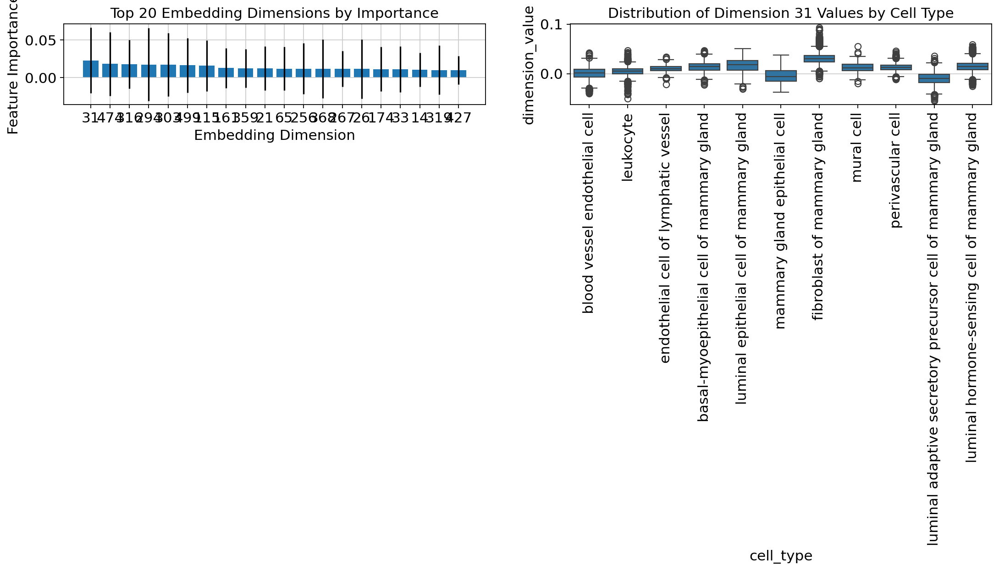

Running ensemble classification with donor 'HBCA_Donor_54' as test set...
Training on 49107 cells, testing on 893 cells
Using LightGBM in ensemble
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.092151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 130560
[LightGBM] [Info] Number of data points in the train set: 49107, number of used features: 512
[LightGBM] [Info] Start training from score -3.193879
[LightGBM] [Info] Start training from score -1.820452
[LightGBM] [Info] Start training from score -4.042502
[LightGBM] [Info] Start training from score -1.483370
[LightGBM] [Info] Start training from score -3.391410
[LightGBM] [Info] Start training from score -1.445240
[LightGBM] [Info] Start training from score -4.519490
[LightGBM] [Info] Start training from score -1.873912
[LightGBM] [Info] Start training from score -5.498452
[LightGBM] [Info] Start training from score -5.852997
[LightGBM] [Info] Sta

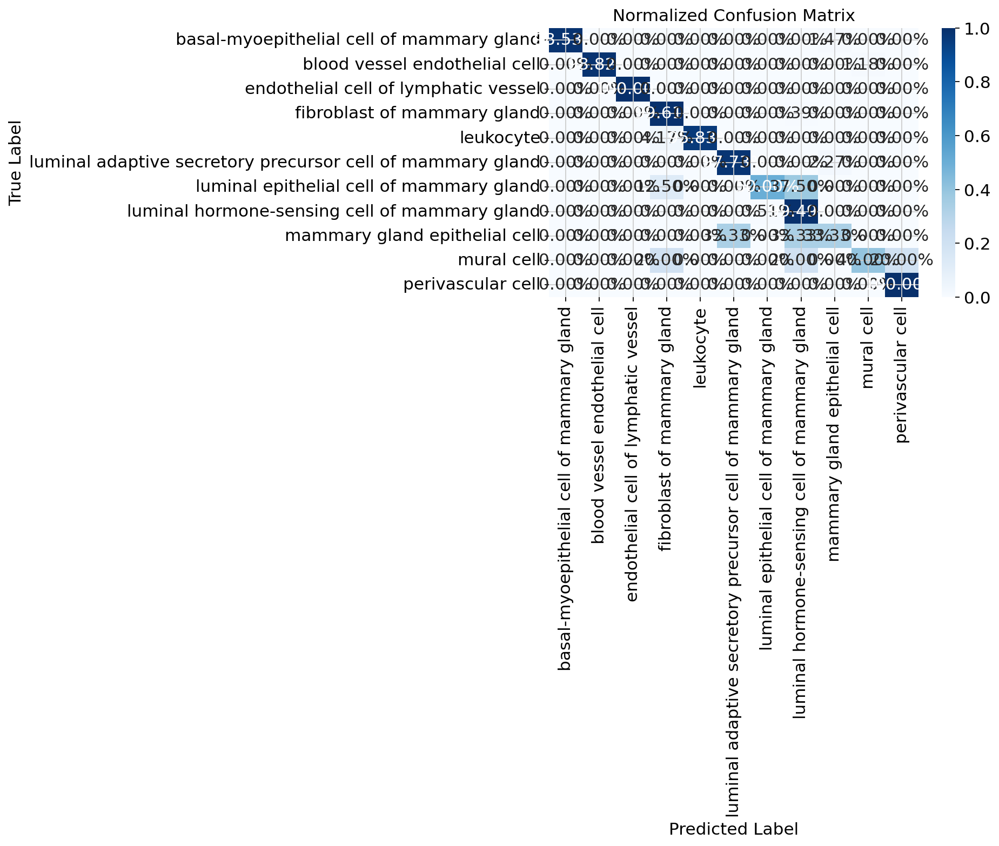

Visualizing classification errors in embedding space...
Computing UMAP projection...


2025-02-19 15:31:24.276036: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-02-19 15:31:25.981525: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Generating comprehensive analysis summary...
Saved summary results to scgpt_embedding_analysis_results.csv

EMBEDDING ANALYSIS SUMMARY
Analysis completed: 2025-02-19 15:31:59

Embedding Quality:
  Silhouette Score: 0.1207
  Separation Ratio: 1.3502
  Donor Effect Score: -0.0783

Classification Performance:
  Accuracy: 0.9832
  Balanced Accuracy: 0.8303
  Macro F1: 0.8512
  Weighted F1: 0.9820

Confidence Analysis:
  Mean Confidence (correct): 0.9782
  Mean Confidence (errors): 0.6584
  Confidence Gap: 0.3199

Embedding space interpretability:
  Most important dimension: 31
  Distinguishes between: luminal epithelial cell of mammary gland, fibroblast of mammary gland (high) and
                         luminal adaptive secretory precursor cell of mammary gland, mammary gland epithelial cell (low)

Advanced embedding analysis complete!


In [37]:
from sklearn.metrics import silhouette_score, confusion_matrix, classification_report
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
import scipy.stats as stats
from tqdm.notebook import tqdm
import plotly.express as px
import plotly.graph_objects as go

print("Starting advanced embedding analysis...")


# Step 1: Calculate embedding quality metrics
def calculate_embedding_quality(adata, embedding_key='X_scGPT', label_key='cell_type'):
    """Calculate quantitative metrics for embedding quality"""
    embeddings = adata.obsm[embedding_key]
    labels = adata.obs[label_key]
    
    # Calculate silhouette score (higher = better cluster separation)
    sil_score = silhouette_score(embeddings, labels)
    
    # Calculate batch effect score using donor information
    donor_effect = None
    if 'donor_id' in adata.obs:
        donors = adata.obs['donor_id']
        # Lower donor silhouette = less donor batch effect
        donor_effect = silhouette_score(embeddings, donors)
    
    # Calculate average distance to same-class cells vs different-class cells
    unique_labels = np.unique(labels)
    within_class_distances = []
    between_class_distances = []
    
    # Sample cells for efficiency (if dataset is large)
    n_sample = min(5000, len(embeddings))
    sample_indices = np.random.choice(len(embeddings), n_sample, replace=False)
    sample_embeddings = embeddings[sample_indices]
    sample_labels = labels.iloc[sample_indices]
    
    # Calculate distances
    from sklearn.metrics.pairwise import euclidean_distances
    dist_matrix = euclidean_distances(sample_embeddings)
    
    for i in range(n_sample):
        current_label = sample_labels.iloc[i]
        # Get indices of same-class and different-class cells
        same_class = np.where(sample_labels == current_label)[0]
        diff_class = np.where(sample_labels != current_label)[0]
        
        # Exclude self from same_class
        same_class = same_class[same_class != i]
        
        # Calculate average distances
        if len(same_class) > 0:
            within_class_distances.append(np.mean(dist_matrix[i, same_class]))
        if len(diff_class) > 0:
            between_class_distances.append(np.mean(dist_matrix[i, diff_class]))
    
    # Calculate separation ratio (higher = better)
    separation_ratio = np.mean(between_class_distances) / np.mean(within_class_distances)
    
    return {
        'silhouette_score': sil_score,
        'donor_effect_score': donor_effect,
        'within_class_distance': np.mean(within_class_distances),
        'between_class_distance': np.mean(between_class_distances),
        'separation_ratio': separation_ratio
    }

# Calculate metrics
quality_metrics = calculate_embedding_quality(embedded_data)
print("Embedding quality metrics:")
for metric, value in quality_metrics.items():
    if value is not None:
        print(f"  {metric}: {value:.4f}")

# %%
# Step 2: Compare with PCA as baseline (if not already done)
if 'X_pca' not in embedded_data.obsm:
    print("Calculating PCA embedding for comparison...")
    import scanpy as sc
    sc.pp.pca(embedded_data, n_comps=min(50, embedded_data.obsm['X_scGPT'].shape[1]))

# Calculate PCA quality metrics
if 'X_pca' in embedded_data.obsm:
    pca_metrics = calculate_embedding_quality(embedded_data, embedding_key='X_pca')
    print("\nPCA embedding quality metrics:")
    for metric, value in pca_metrics.items():
        if value is not None:
            print(f"  {metric}: {value:.4f}")
    
    # Calculate improvement ratios
    print("\nImprovement ratios (scGPT vs PCA):")
    improvement = {}
    for metric in ['silhouette_score', 'separation_ratio']:
        if metric in quality_metrics and metric in pca_metrics:
            ratio = quality_metrics[metric] / pca_metrics[metric]
            improvement[metric] = ratio
            print(f"  {metric}: {ratio:.2f}x improvement")
    
    # For donor effect, lower is better
    if 'donor_effect_score' in quality_metrics and 'donor_effect_score' in pca_metrics:
        ratio = pca_metrics['donor_effect_score'] / quality_metrics['donor_effect_score']
        improvement['donor_effect_reduction'] = ratio
        print(f"  donor_effect_reduction: {ratio:.2f}x improvement")

# %%
# Step 3: Analyze embedding dimensions using feature importance
def analyze_embedding_dimensions(X, y, embedding_matrix, n_top_dims=20):
    """Identify and analyze important embedding dimensions using Random Forest feature importance"""
    # Train Random Forest to get feature importances
    rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    rf.fit(X, y)
    
    # Get feature importances
    importances = rf.feature_importances_
    std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)
    
    # Create importance DataFrame
    importance_df = pd.DataFrame({
        'dimension': np.arange(len(importances)),
        'importance': importances,
        'std': std
    }).sort_values('importance', ascending=False)
    
    # Get top dimensions
    top_dims = importance_df.head(n_top_dims)['dimension'].values
    
    # Analyze each top dimension's relationship with cell types
    unique_cell_types = np.unique(y)
    dimension_profiles = {}
    
    for dim in top_dims:
        dim_values = embedding_matrix[:, dim]
        
        # Calculate statistics per cell type
        cell_type_stats = {}
        for cell_type in unique_cell_types:
            values = dim_values[y == cell_type]
            cell_type_stats[cell_type] = {
                'mean': np.mean(values),
                'median': np.median(values),
                'std': np.std(values),
                'min': np.min(values),
                'max': np.max(values)
            }
        
        # Find which cell types this dimension best distinguishes
        means = {ct: stats['mean'] for ct, stats in cell_type_stats.items()}
        sorted_by_mean = sorted(means.items(), key=lambda x: x[1])
        
        # Check if this dimension significantly separates any cell types
        # using ANOVA to test for differences between groups
        f_val, p_val = stats.f_oneway(*[dim_values[y == ct] for ct in unique_cell_types])
        
        dimension_profiles[dim] = {
            'cell_type_stats': cell_type_stats,
            'lowest_mean_types': [t[0] for t in sorted_by_mean[:2]],
            'highest_mean_types': [t[0] for t in sorted_by_mean[-2:]],
            'f_statistic': f_val,
            'p_value': p_val,
        }
    
    return {
        'importance_ranking': importance_df,
        'top_dimensions': top_dims,
        'dimension_profiles': dimension_profiles
    }

# Prepare data for dimension analysis
X = embedded_data.obsm['X_scGPT']
y = embedded_data.obs['cell_type']

# Run dimension analysis
print("Analyzing embedding dimensions...")
dimension_analysis = analyze_embedding_dimensions(X, y, X)

# Display top dimensions
print(f"\nTop 10 embedding dimensions by importance:")
print(dimension_analysis['importance_ranking'].head(10))

# Display what the top dimension distinguishes
top_dim = dimension_analysis['top_dimensions'][0]
top_profile = dimension_analysis['dimension_profiles'][top_dim]
print(f"\nTop dimension ({top_dim}) best distinguishes:")
print(f"  Highest values: {', '.join(top_profile['highest_mean_types'])}")
print(f"  Lowest values: {', '.join(top_profile['lowest_mean_types'])}")
print(f"  F-statistic: {top_profile['f_statistic']:.2f}, p-value: {top_profile['p_value']:.2e}")

# Visualize top dimensions
plt.figure(figsize=(14, 8))
plt.subplot(1, 2, 1)
# Plot feature importances
top_n = 20
indices = dimension_analysis['importance_ranking'].head(top_n).index
plt.bar(range(top_n), 
        dimension_analysis['importance_ranking'].iloc[:top_n]['importance'],
        yerr=dimension_analysis['importance_ranking'].iloc[:top_n]['std'],
        align='center')
plt.xticks(range(top_n), dimension_analysis['importance_ranking'].iloc[:top_n]['dimension'])
plt.xlabel('Embedding Dimension')
plt.ylabel('Feature Importance')
plt.title('Top 20 Embedding Dimensions by Importance')

# Plot dimension distribution for top dimension
plt.subplot(1, 2, 2)
# Get data for top dimension
dim_idx = dimension_analysis['top_dimensions'][0]
dim_values = X[:, dim_idx]
# Create DataFrame for easy plotting
plot_df = pd.DataFrame({
    'dimension_value': dim_values,
    'cell_type': y
})
# Plot boxplot
sns.boxplot(x='cell_type', y='dimension_value', data=plot_df)
plt.xticks(rotation=90)
plt.title(f'Distribution of Dimension {dim_idx} Values by Cell Type')
plt.tight_layout()
plt.show()

# %%
# Step 4: Comprehensive classification analysis with error analysis
def run_ensemble_classification(X, y, donor_ids, test_donor, cell_types=None):
    """Run ensemble classification with detailed performance analysis"""
    # Prepare train/test split
    train_mask = donor_ids != test_donor
    test_mask = ~train_mask
    
    X_train = X[train_mask]
    y_train = y[train_mask]
    X_test = X[test_mask]
    y_test = y[test_mask]
    
    print(f"Training on {X_train.shape[0]} cells, testing on {X_test.shape[0]} cells")
    
    # Create and train ensemble classifier
    models = [
        ('rf', RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)),
        ('knn', KNeighborsClassifier(n_neighbors=10, n_jobs=-1))
    ]
    
    # Add LightGBM if available
    try:
        from lightgbm import LGBMClassifier
        models.append(('lgbm', LGBMClassifier(random_state=42, n_jobs=-1)))
        print("Using LightGBM in ensemble")
    except ImportError:
        print("LightGBM not available, using RF and KNN only")
    
    # Create and train ensemble
    ensemble = VotingClassifier(estimators=models, voting='soft')
    ensemble.fit(X_train, y_train)
    
    # Make predictions
    y_pred = ensemble.predict(X_test)
    y_proba = ensemble.predict_proba(X_test)
    
    # Calculate basic metrics
    from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score
    accuracy = accuracy_score(y_test, y_pred)
    balanced_acc = balanced_accuracy_score(y_test, y_pred)
    macro_f1 = f1_score(y_test, y_pred, average='macro')
    weighted_f1 = f1_score(y_test, y_pred, average='weighted')
    
    # Get class names if not provided
    if cell_types is None:
        cell_types = np.unique(y)
    
    # Create confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    # Error analysis
    errors = y_test != y_pred
    error_indices = np.where(errors)[0]
    error_rate = errors.mean()
    
    # Calculate confidence metrics
    confidence = np.max(y_proba, axis=1)
    correct_conf = confidence[~errors]
    error_conf = confidence[errors]
    
    # Most commonly confused classes
    error_pairs = list(zip(y_test[errors], y_pred[errors]))
    confusion_counts = pd.Series(error_pairs).value_counts().head(5)
    
    results = {
        'model': ensemble,
        'accuracy': accuracy,
        'balanced_accuracy': balanced_acc,
        'macro_f1': macro_f1,
        'weighted_f1': weighted_f1,
        'error_rate': error_rate,
        'confusion_matrix': cm,
        'confusion_matrix_norm': cm_norm,
        'confidence_metrics': {
            'mean_confidence': np.mean(confidence),
            'correct_confidence': np.mean(correct_conf),
            'error_confidence': np.mean(error_conf),
            'confidence_gap': np.mean(correct_conf) - np.mean(error_conf)
        },
        'common_confusions': confusion_counts,
        'predictions': y_pred,
        'probabilities': y_proba,
        'errors': errors
    }
    
    return results

# Run classification using a selected test donor
test_donor = embedded_data.obs['donor_id'].unique()[0]
X = embedded_data.obsm['X_scGPT']
y = embedded_data.obs['cell_type'].values
donor_ids = embedded_data.obs['donor_id'].values

print(f"Running ensemble classification with donor '{test_donor}' as test set...")
classification_results = run_ensemble_classification(X, y, donor_ids, test_donor)

# Display results
print("\nClassification Performance:")
print(f"  Accuracy: {classification_results['accuracy']:.4f}")
print(f"  Balanced Accuracy: {classification_results['balanced_accuracy']:.4f}")
print(f"  Macro F1: {classification_results['macro_f1']:.4f}")
print(f"  Weighted F1: {classification_results['weighted_f1']:.4f}")

print("\nConfidence Analysis:")
conf_metrics = classification_results['confidence_metrics']
print(f"  Mean confidence (correct predictions): {conf_metrics['correct_confidence']:.4f}")
print(f"  Mean confidence (incorrect predictions): {conf_metrics['error_confidence']:.4f}")
print(f"  Confidence gap: {conf_metrics['confidence_gap']:.4f}")

print("\nMost Common Confusions:")
for (true_label, pred_label), count in classification_results['common_confusions'].items():
    print(f"  {true_label} → {pred_label}: {count} instances")

# Visualize confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(classification_results['confusion_matrix_norm'], 
            annot=True, fmt='.2%', cmap='Blues',
            xticklabels=np.unique(y),
            yticklabels=np.unique(y))
plt.title('Normalized Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# %%
# Step 5: Visualize classification errors in embedding space
def visualize_classification_errors(adata, error_mask, method='umap'):
    """Visualize where classification errors occur in the embedding space"""
    # Create UMAP if it doesn't exist
    if 'X_umap' not in adata.obsm:
        print("Computing UMAP projection...")
        import scanpy as sc
        sc.pp.neighbors(adata, use_rep='X_scGPT')
        sc.tl.umap(adata)
    
    # Get embedding coordinates based on method
    if method == 'umap':
        embedding = adata.obsm['X_umap']
    elif method == 'tsne':
        if 'X_tsne' not in adata.obsm:
            print("Computing t-SNE projection...")
            from sklearn.manifold import TSNE
            adata.obsm['X_tsne'] = TSNE(n_components=2, random_state=42).fit_transform(adata.obsm['X_scGPT'])
        embedding = adata.obsm['X_tsne']
    else:
        # Use first two PCs
        if 'X_pca' not in adata.obsm:
            import scanpy as sc
            sc.pp.pca(adata)
        embedding = adata.obsm['X_pca'][:, :2]
    
    # Create interactive plot with Plotly
    df = pd.DataFrame({
        'UMAP1': embedding[:, 0],
        'UMAP2': embedding[:, 1],
        'Cell Type': adata.obs['cell_type'],
        'Donor': adata.obs['donor_id'],
        'Classification': ['Error' if e else 'Correct' for e in error_mask]
    })
    
    # Create figure
    fig = px.scatter(
        df, x='UMAP1', y='UMAP2', 
        color='Classification',
        color_discrete_map={'Correct': 'lightgrey', 'Error': 'red'},
        hover_data=['Cell Type', 'Donor'],
        opacity=0.7,
        title=f'Classification Errors in {method.upper()} Space'
    )
    
    fig.update_layout(
        width=900,
        height=700,
        legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01)
    )
    
    # Show the plot
    return fig

# For testing donor, create mask for the corresponding errors
full_error_mask = np.zeros(len(embedded_data), dtype=bool)
test_indices = np.where(embedded_data.obs['donor_id'] == test_donor)[0]
test_errors = classification_results['errors']

for i, idx in enumerate(test_indices):
    if i < len(test_errors) and test_errors[i]:
        full_error_mask[idx] = True

# Visualize errors
print("Visualizing classification errors in embedding space...")
error_viz = visualize_classification_errors(embedded_data, full_error_mask)
display(error_viz)

# %%
# Step 6: Generate comprehensive summary and save results
def generate_summary_report(quality_metrics, dimension_analysis, classification_results):
    """Generate a comprehensive summary report of all analyses"""
    summary = {
        'embedding_quality': quality_metrics,
        'top_dimensions': dimension_analysis['importance_ranking'].head(10).to_dict(),
        'classification_performance': {
            'accuracy': classification_results['accuracy'],
            'balanced_accuracy': classification_results['balanced_accuracy'],
            'macro_f1': classification_results['macro_f1'],
            'weighted_f1': classification_results['weighted_f1'],
            'error_rate': classification_results['error_rate'],
            'confidence_metrics': classification_results['confidence_metrics'],
        },
        'timestamp': pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')
    }
    
    # Create summary table
    summary_df = pd.DataFrame([{
        'Analysis Date': summary['timestamp'],
        'Silhouette Score': summary['embedding_quality']['silhouette_score'],
        'Separation Ratio': summary['embedding_quality']['separation_ratio'],
        'Classification Accuracy': summary['classification_performance']['accuracy'],
        'Macro F1 Score': summary['classification_performance']['macro_f1'],
        'Confidence Gap': summary['classification_performance']['confidence_metrics']['confidence_gap'],
        'Top Dimension': list(dimension_analysis['importance_ranking'].head(1)['dimension'])[0]
    }])
    
    # Save results
    results_path = 'scgpt_embedding_analysis_results.csv'
    summary_df.to_csv(results_path, index=False)
    print(f"Saved summary results to {results_path}")
    
    # Create printable summary
    print("\n" + "="*50)
    print("EMBEDDING ANALYSIS SUMMARY")
    print("="*50)
    print(f"Analysis completed: {summary['timestamp']}")
    print("\nEmbedding Quality:")
    print(f"  Silhouette Score: {summary['embedding_quality']['silhouette_score']:.4f}")
    print(f"  Separation Ratio: {summary['embedding_quality']['separation_ratio']:.4f}")
    if 'donor_effect_score' in summary['embedding_quality']:
        print(f"  Donor Effect Score: {summary['embedding_quality']['donor_effect_score']:.4f}")
    
    print("\nClassification Performance:")
    print(f"  Accuracy: {summary['classification_performance']['accuracy']:.4f}")
    print(f"  Balanced Accuracy: {summary['classification_performance']['balanced_accuracy']:.4f}")
    print(f"  Macro F1: {summary['classification_performance']['macro_f1']:.4f}")
    print(f"  Weighted F1: {summary['classification_performance']['weighted_f1']:.4f}")
    
    print("\nConfidence Analysis:")
    conf = summary['classification_performance']['confidence_metrics']
    print(f"  Mean Confidence (correct): {conf['correct_confidence']:.4f}")
    print(f"  Mean Confidence (errors): {conf['error_confidence']:.4f}")
    print(f"  Confidence Gap: {conf['confidence_gap']:.4f}")
    
    print("\nEmbedding space interpretability:")
    top_dim = list(dimension_analysis['importance_ranking'].head(1)['dimension'])[0]
    top_profile = dimension_analysis['dimension_profiles'][top_dim]
    print(f"  Most important dimension: {top_dim}")
    print(f"  Distinguishes between: {', '.join(top_profile['highest_mean_types'])} (high) and")
    print(f"                         {', '.join(top_profile['lowest_mean_types'])} (low)")
    
    return summary

# Generate and display summary
print("Generating comprehensive analysis summary...")
analysis_summary = generate_summary_report(quality_metrics, dimension_analysis, classification_results)

print("\nAdvanced embedding analysis complete!")

In [38]:
def plot_readable_confusion_matrix(y_true, y_pred, class_names=None):
    """
    Create a more readable confusion matrix for datasets with many classes
    by using abbreviated names and focusing on errors.
    """
    from sklearn.metrics import confusion_matrix
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np
    import pandas as pd
    
    # Calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    
    # If class names not provided, use unique values
    if class_names is None:
        class_names = np.unique(y_true)
    
    # Create abbreviated class names for better visualization
    # Keep first word and truncate at 10 characters
    short_names = []
    name_mapping = {}
    for name in class_names:
        # Take first word + first letter of second word if available
        parts = name.split()
        if len(parts) > 1:
            short = f"{parts[0][:8]}_{parts[1][0]}"
        else:
            short = parts[0][:10]
        short_names.append(short)
        name_mapping[short] = name
    
    # Normalize matrix (by row/true class)
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    # Create a DataFrame for easier manipulation
    cm_df = pd.DataFrame(cm_norm, index=short_names, columns=short_names)
    
    # Plot the normalized confusion matrix
    plt.figure(figsize=(14, 12))
    ax = sns.heatmap(cm_df, annot=True, fmt='.1%', cmap='Blues', vmin=0, vmax=1,
                    linewidths=0.2, linecolor='lightgray')
    
    # Improve readability
    plt.title('Cell Type Classification Confusion Matrix\n(Normalized by True Class - Recall)', fontsize=16)
    plt.ylabel('True Cell Type', fontsize=14)
    plt.xlabel('Predicted Cell Type', fontsize=14)
    
    # Rotate axis labels for better readability
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    
    # Add a legend explaining the short names
    legend_text = "\n".join([f"{short}: {full}" for short, full in name_mapping.items()])
    plt.figtext(1.02, 0.5, f"Class Name Legend:\n{legend_text}", 
                verticalalignment='center', fontsize=9)
    
    plt.tight_layout()
    
    # Create a second figure focusing only on errors
    # Remove diagonal (correct predictions) to highlight errors
    np.fill_diagonal(cm_norm, 0)
    cm_errors_df = pd.DataFrame(cm_norm, index=short_names, columns=short_names)
    
    # Plot error-focused matrix
    plt.figure(figsize=(14, 12))
    ax = sns.heatmap(cm_errors_df, annot=True, fmt='.1%', cmap='Reds', 
                    vmin=0, vmax=0.3,  # Adjust scale to highlight small errors
                    linewidths=0.2, linecolor='lightgray')
    
    plt.title('Error Analysis - Confusion Matrix\n(Diagonal Elements Removed to Highlight Errors)', fontsize=16)
    plt.ylabel('True Cell Type', fontsize=14)
    plt.xlabel('Predicted Cell Type', fontsize=14)
    
    # Rotate axis labels
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)
    
    plt.tight_layout()
    
    # Calculate and return key statistics
    misclassification_stats = {}
    for i, true_class in enumerate(short_names):
        errors = [(pred_class, cm_norm[i,j]) 
                 for j, pred_class in enumerate(short_names) 
                 if i != j and cm_norm[i,j] > 0.05]  # Focus on significant errors
        
        if errors:
            errors.sort(key=lambda x: x[1], reverse=True)
            misclassification_stats[true_class] = errors
    
    return misclassification_stats

Analyzing confusion matrix for 893 cells across 11 cell types...



Key Misclassification Patterns:

luminal_e is most often misclassified as:
  → luminal_h: 37.5%
  → fibrobla_o: 12.5%

mammary_g is most often misclassified as:
  → luminal_a: 33.3%
  → luminal_h: 33.3%

mural_c is most often misclassified as:
  → fibrobla_o: 20.0%
  → luminal_h: 20.0%
  → perivasc_c: 20.0%


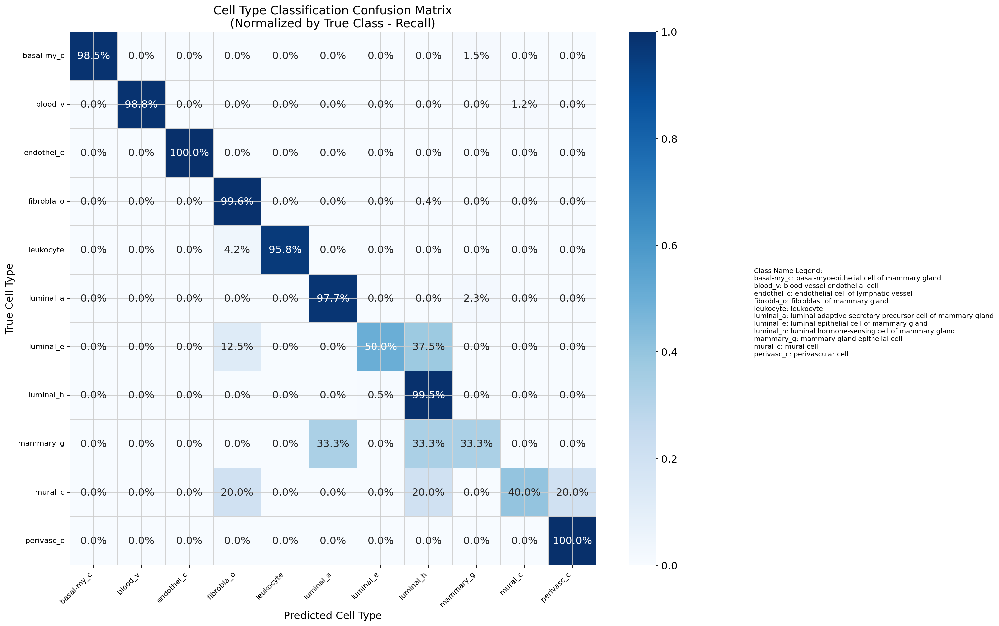

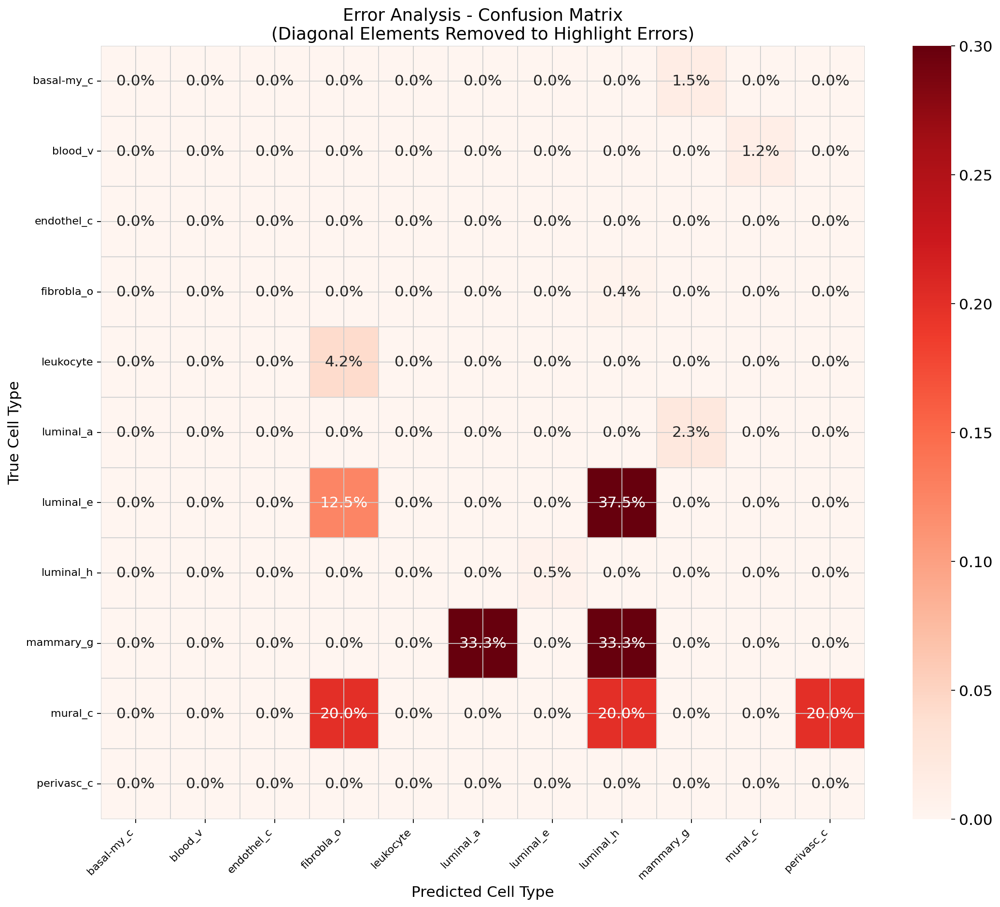

In [39]:
# After your classification has been completed with results stored in 'classification_results'
def plot_readable_confusion_matrix_analysis():
    """Run the confusion matrix analysis with more readable output"""
    # Get the classification results
    test_donor = embedded_data.obs['donor_id'].unique()[0]
    test_mask = embedded_data.obs['donor_id'] == test_donor
    
    # Extract true and predicted labels
    y_true = embedded_data.obs['cell_type'][test_mask].values
    y_pred = classification_results['predictions']
    
    # Verify lengths match (important for analysis)
    if len(y_true) != len(y_pred):
        print(f"Warning: Length mismatch between true labels ({len(y_true)}) and predictions ({len(y_pred)})")
        # Find the correct indices to match lengths
        if test_mask.sum() > len(y_pred):
            # If there are more test cells than predictions, get indices of the first matching number
            test_indices = np.where(test_mask)[0][:len(y_pred)]
            y_true = embedded_data.obs['cell_type'].iloc[test_indices].values
        else:
            # If there are more predictions than test cells, truncate predictions
            y_pred = y_pred[:test_mask.sum()]
    
    # Get unique class names
    class_names = np.unique(np.concatenate([y_true, y_pred]))
    
    print(f"Analyzing confusion matrix for {len(y_true)} cells across {len(class_names)} cell types...")
    
    # Call the function to create the visualizations
    misclassification_stats = plot_readable_confusion_matrix(y_true, y_pred, class_names)
    
    # Save the figures
    plt.figure(1)
    plt.savefig('confusion_matrix_normalized.png', bbox_inches='tight', dpi=300)
    
    plt.figure(2)
    plt.savefig('confusion_matrix_errors.png', bbox_inches='tight', dpi=300)
    
    # Print out key misclassification patterns
    print("\nKey Misclassification Patterns:")
    for true_class, errors in misclassification_stats.items():
        if errors:
            print(f"\n{true_class} is most often misclassified as:")
            for pred_class, rate in errors:
                print(f"  → {pred_class}: {rate:.1%}")
    
    return misclassification_stats

# Run the analysis
misclassification_results = plot_readable_confusion_matrix_analysis()

## Block 4: Visualizing the data


## Block 5: Saving the data


In [43]:
import os
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
from datetime import datetime
import numpy as np
from pathlib import Path

def save_comprehensive_analysis(adata, classification_results, embedding_quality_metrics, 
                              dimension_analysis, confusion_stats, save_dir=None):
    """
    Save a comprehensive record of scGPT embedding analysis with index name conflict resolution
    """
    # Create timestamp and directories (same as before)
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    if save_dir is None:
        save_dir = f"scGPT_analysis_results_{timestamp}"
    save_dir = Path(save_dir)
    save_dir.mkdir(parents=True, exist_ok=True)
    (save_dir / "figures").mkdir(exist_ok=True)
    (save_dir / "tables").mkdir(exist_ok=True)
    
    print(f"Saving comprehensive analysis to: {save_dir}")
    
    # 1. Save the annotated data object with index fixes
    try:
        # Create a copy
        adata_save = adata.copy()
        
        # Fix index name conflicts in var
        if adata_save.var.index.name == 'feature_name' and 'feature_name' in adata_save.var.columns:
            print("Fixing index name conflict in var...")
            # Rename the column if it exists
            if 'feature_name' in adata_save.var.columns:
                adata_save.var = adata_save.var.rename(columns={'feature_name': 'feature_name_col'})
        
        # Fix any reserved column names
        for col in adata_save.var.columns:
            if col.startswith('_'):
                new_col = col.strip('_') + '_col'
                adata_save.var = adata_save.var.rename(columns={col: new_col})
        
        # Reset index names if they conflict with columns
        if adata_save.var.index.name in adata_save.var.columns:
            adata_save.var.index.name = None
        if adata_save.obs.index.name in adata_save.obs.columns:
            adata_save.obs.index.name = None
            
        # Save as h5ad
        adata_file = save_dir / "embedded_data.h5ad"
        print(f"Saving annotated data to: {adata_file}")
        adata_save.write(adata_file)
        
    except Exception as e:
        print(f"Error saving h5ad: {str(e)}")
        print("Saving pickle backup instead...")
        pickle_file = save_dir / "embedded_data.pickle"
        with open(pickle_file, 'wb') as f:
            pickle.dump(adata, f)
    
    # 2. Save classification results
    if classification_results:
        metrics_df = pd.DataFrame({
            'accuracy': [classification_results.get('accuracy', None)],
            'balanced_accuracy': [classification_results.get('balanced_accuracy', None)],
            'macro_f1': [classification_results.get('macro_f1', None)],
            'weighted_f1': [classification_results.get('weighted_f1', None)],
            'error_rate': [classification_results.get('error_rate', None)]
        })
        
        if 'confidence_metrics' in classification_results:
            for k, v in classification_results['confidence_metrics'].items():
                metrics_df[k] = [v]
        
        metrics_df.to_csv(save_dir / "tables" / "classification_metrics.csv")
        
        # Save full results
        with open(save_dir / "classification_results.pickle", 'wb') as f:
            pickle.dump(classification_results, f)
    
    # 3. Save embedding quality metrics
    if embedding_quality_metrics:
        quality_df = pd.DataFrame({k: [v] for k, v in embedding_quality_metrics.items()})
        quality_df.to_csv(save_dir / "tables" / "embedding_quality.csv")
    
    # 4. Save dimension analysis
    if dimension_analysis and 'importance_ranking' in dimension_analysis:
        # Save rankings
        dimension_analysis['importance_ranking'].to_csv(
            save_dir / "tables" / "dimension_importance.csv")
        
        # Save full analysis
        with open(save_dir / "dimension_analysis.pickle", 'wb') as f:
            pickle.dump(dimension_analysis, f)
        
        # Create visualization
        plt.figure(figsize=(12, 6))
        top_n = min(20, len(dimension_analysis['importance_ranking']))
        dims = dimension_analysis['importance_ranking'].head(top_n)
        plt.bar(range(top_n), dims['importance'], 
                yerr=dims.get('std', None) if 'std' in dims.columns else None)
        plt.xlabel('Dimension Index')
        plt.ylabel('Importance Score')
        plt.title('Top Important Embedding Dimensions')
        plt.xticks(range(top_n), dims['dimension'])
        plt.tight_layout()
        plt.savefig(save_dir / "figures" / "top_dimensions.png", dpi=300)
        plt.close()
    
    # 5. Generate summary report
    with open(save_dir / "analysis_summary.md", 'w') as f:
        f.write(f"# scGPT Embedding Analysis Summary\n\n")
        f.write(f"Analysis performed: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
        
        # Dataset info
        f.write(f"## Dataset Information\n\n")
        f.write(f"- Number of cells: {adata.n_obs}\n")
        f.write(f"- Number of genes: {adata.n_vars}\n")
        if 'X_scGPT' in adata.obsm:
            f.write(f"- Embedding dimensions: {adata.obsm['X_scGPT'].shape[1]}\n")
        if 'cell_type' in adata.obs:
            f.write(f"- Number of cell types: {adata.obs['cell_type'].nunique()}\n")
        if 'donor_id' in adata.obs:
            f.write(f"- Number of donors: {adata.obs['donor_id'].nunique()}\n")
        f.write("\n")
        
        # Quality metrics
        if embedding_quality_metrics:
            f.write(f"## Embedding Quality\n\n")
            for metric, value in embedding_quality_metrics.items():
                f.write(f"- {metric}: {value:.4f}\n")
            f.write("\n")
        
        # Classification results
        if classification_results:
            f.write(f"## Classification Performance\n\n")
            metrics = ['accuracy', 'balanced_accuracy', 'macro_f1', 'weighted_f1']
            for metric in metrics:
                if metric in classification_results:
                    f.write(f"- {metric}: {classification_results[metric]:.4f}\n")
            
            if 'confidence_metrics' in classification_results:
                f.write(f"\n### Confidence Analysis\n\n")
                for metric, value in classification_results['confidence_metrics'].items():
                    f.write(f"- {metric}: {value:.4f}\n")
            f.write("\n")
        
        # Dimension analysis
        if dimension_analysis and 'importance_ranking' in dimension_analysis:
            f.write(f"## Top Embedding Dimensions\n\n")
            f.write("| Dimension | Importance | Std |\n")
            f.write("|-----------|------------|-----|\n")
            for _, row in dimension_analysis['importance_ranking'].head(10).iterrows():
                std_val = row.get('std', 0)
                f.write(f"| {int(row['dimension'])} | {row['importance']:.4f} | {std_val:.4f} |\n")
            f.write("\n")
        
        # Confusion patterns
        if confusion_stats:
            f.write(f"## Key Confusion Patterns\n\n")
            for true_class, errors in confusion_stats.items():
                if errors:
                    f.write(f"### {true_class}\n")
                    f.write("| Predicted As | Rate |\n")
                    f.write("|--------------|------|\n")
                    for pred_class, rate in errors:
                        f.write(f"| {pred_class} | {rate:.2%} |\n")
                    f.write("\n")
    
    print(f"Analysis successfully saved to {save_dir}")
    return save_dir

# Usage example:
try:
    save_path = save_comprehensive_analysis(
        adata=embedded_data,
        classification_results=classification_results,
        embedding_quality_metrics=quality_metrics,
        dimension_analysis=dimension_analysis,
        confusion_stats=misclassification_results
    )
    print(f"All analysis results saved to: {save_path}")
except Exception as e:
    print(f"Error during save: {str(e)}")

Saving comprehensive analysis to: scGPT_analysis_results_20250219_153848
Fixing index name conflict in var...
Saving annotated data to: scGPT_analysis_results_20250219_153848/embedded_data.h5ad


Analysis successfully saved to scGPT_analysis_results_20250219_153848
All analysis results saved to: scGPT_analysis_results_20250219_153848


In [44]:
adata1 = sc.read(r"/root/scGPT_dir/scGPT/scGPT_tools/notebooks/scGPT_analysis_results_20250219_153848/embedded_data.h5ad")

In [45]:
print (adata1)

AnnData object with n_obs × n_vars = 50000 × 23195
    obs: 'cell_type', 'donor_id'
    var: 'index_col', 'dispersions', 'dispersions_norm', 'feature_biotype', 'feature_is_filtered', 'feature_length', 'feature_name_col', 'feature_reference', 'feature_type', 'feature_types', 'gene_name', 'genome', 'highly_variable', 'means', 'n_cells', 'id_in_vocab'
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_scGPT', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
